# Growing stock volume estimation through remote sensing data

This notebook presents the task of growing stock volume (GSV) estimation through remote sensing data. As a study area, we consider forestry in Perm Krai. The dataset was collected in 2020 using ground based measurements.

Each study plot is a circle with a fixed radius of 9m.

We use Sentinel-2 data as resource of remote sensing observations.

#### Small definitions

Growing stock volume (GSV) is the total over-bark volume of all living trees in a defined forest area, typically measured in m3/ha.

It is a critical metric for forest management, sustainability planning, and quantifying carbon stocks. GSV is estimated using field inventories and remote sensing.

In [6]:
%%capture 
# is used to suppress the output of a cell

# install library for spatial data processing
! pip install rasterio geopandas

# install packages for spatial data mapping
! pip install folium matplotlib mapclassify tifffile

In [1]:
import numpy as np
import pandas as pd

import rasterio
import tifffile as tiff
import geopandas as gpd

from shapely.geometry import Point
from shapely.geometry import mapping
from rasterio.mask import mask
from rasterio.windows import from_bounds

import matplotlib.pyplot as plt

Let's download data from https://disk.yandex.ru/d/yqVOed67gKPefg

In [ ]:
%%capture

# Get the data, unpack it, and remove zip file

# if you have mac
# brew install wget

! wget https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/yqVOed67gKPefg -O ./GSV_dataset.zip
! unzip ./GSV_dataset.zip
! rm -f GSV_dataset.zip

The dataset includes the following files:

*   2022.tif --- composite image of Sentinel-2 for 2022
*   2023.tif --- composite image of Sentinel-2 for 2023    
*   age.tif --- additional data with forest age estimated by ML model    
*   chm.tif --- canopy height model (chm)
*   dem.tif --- digital elevation model (dem)      
*   data.csv --- data with inventory plots' coordinates and taxation measurements for height and timber volume   

All data have the spatial resolution of 10m per pixel and the same extention.

Satellite images have 10 spectral bands with original resolution from 10 to 20 m per pixel that were brought to 10 m resolution.

The structure of taxation data is the following: we have a set of plots with coordinates and reference data for these plots. Each plot has a radius of 9m. Therefore, each plot cover a several pixels.

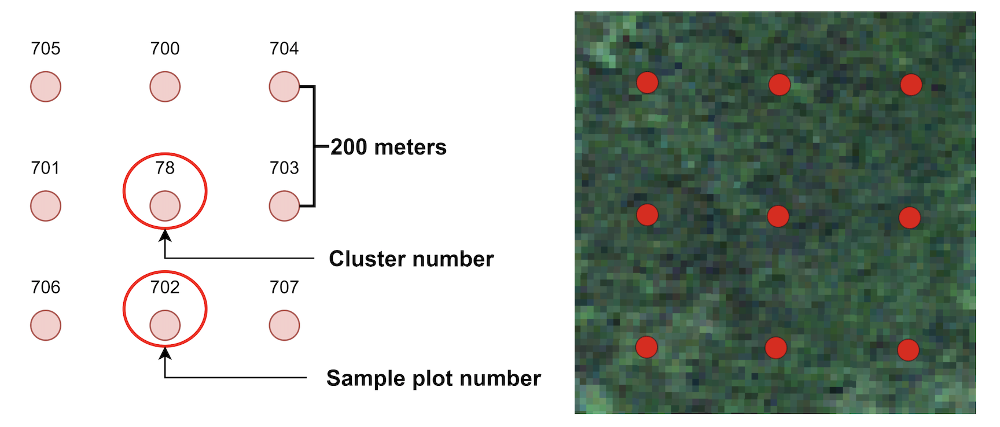

## Brief note about libraries to work with environmental raster data

Here are some TIFF details:

* TIFF stands for Tage Image File Format
* It is often used for environmental and medical imaging
* It contains metadata that can be used both for data processing and visualization in GIS systems

The most popular Python libraries to work with TIFF files are:

* <a href="https://pypi.org/project/rasterio/">rasterio</a> : this is a library that is useful for GIS processing in general
* <a href="https://pypi.org/project/tifffile/">tiffile</a> : more focused on TIFF file processing

# Visualize raster data

Let's open and visualize raster data with satellite images and environmental features.

In [40]:
# read satellite composite image
with rasterio.open('timberstock/2022.tif') as src:
    meta = src.meta
    image = src.read()

# read canopy height model
with rasterio.open('timberstock/chm.tif') as src:
    meta_chm = src.meta
    chm = src.read()
# read digital elevation model
with rasterio.open('timberstock/dem.tif') as src:
    dem = src.read()

# read forest age
with rasterio.open('timberstock/age.tif') as src:
    age = src.read()

In [14]:
meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 65535.0,
 'width': 10000,
 'height': 7200,
 'count': 10,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 40N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",57],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'),
 'transform': Affine(10.0, 0.0, 485999.0,
        0.0, -10.0, 6804001.0)}

In [15]:
print(meta_chm['nodata'])

None


Check the shape of each file

In [16]:
image.shape, chm.shape, dem.shape, age.shape

((10, 7200, 10000), (1, 7200, 10000), (1, 7200, 10000), (1, 7200, 10000))

#### Digital Elevation Models
DEMs provide numerical elevation points representing surface topography. While often used to refer to bare-earth, they can sometimes include surface objects, though technically that is a Digital Surface Model (DSM).

![](https://earthdata.nasa.gov/s3fs-public/styles/hds_generic_card/public/2021-12/Virgin_River_Nevada.jpg?VersionId=srfhZ4kl8_OWLeVSD3_XVYWtctiu0vhV&itok=ZydO-8eP)

(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x1272ad790>)

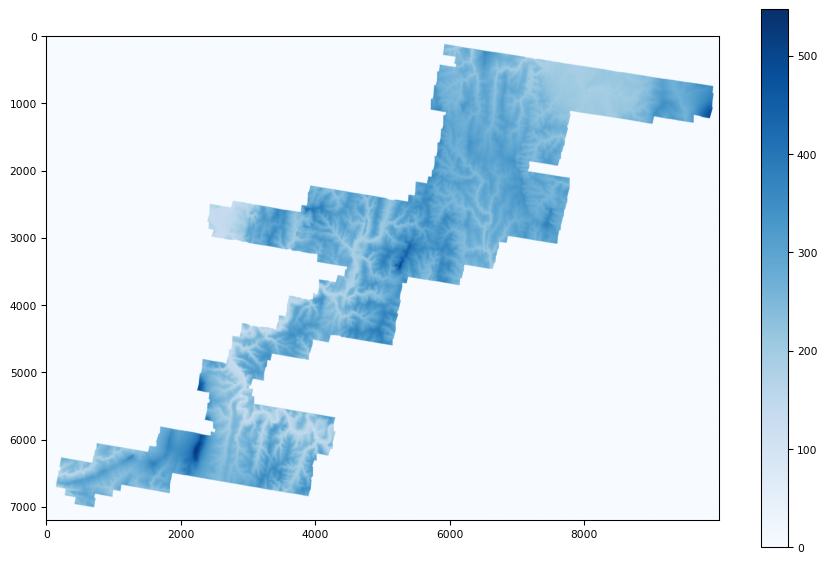

In [17]:
tiff.imshow(dem, cmap='Blues')

#### Canopy Height Model
![](https://i.sstatic.net/1l3EA.png)


(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x1278dbe90>)

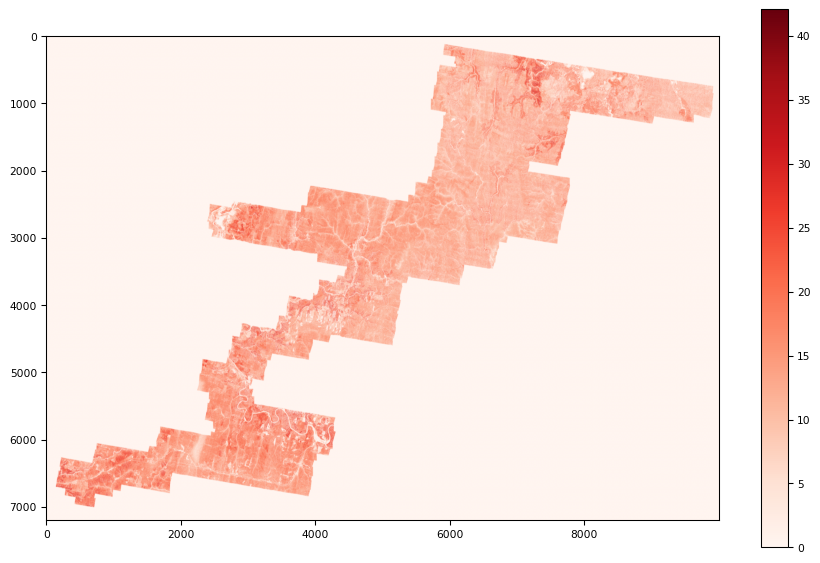

In [18]:
tiff.imshow(chm, cmap='Reds')

(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x1278d9ca0>)

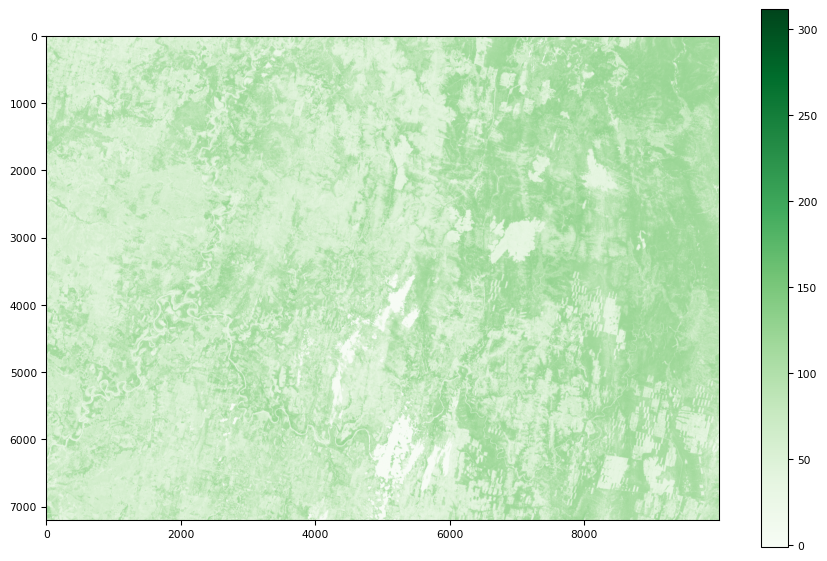

In [19]:
tiff.imshow(age, cmap='Greens')

In [20]:
meta['nodata']

65535.0

In [41]:
image = image.astype(float)
image[image==meta['nodata']] = np.nan

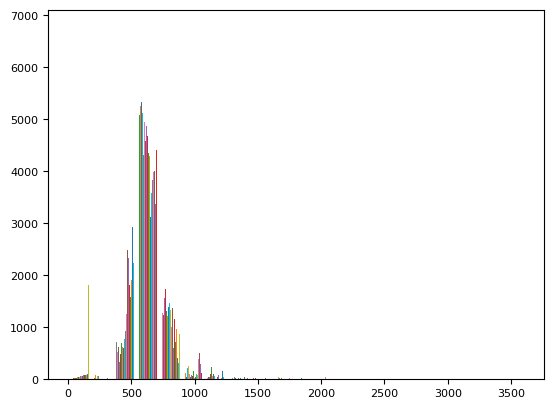

In [43]:
plt.hist(image[3], bins=20);

In [22]:
image = np.clip(image, 0, 1000)

(<Figure size 988.8x604.8 with 3 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x127883770>)

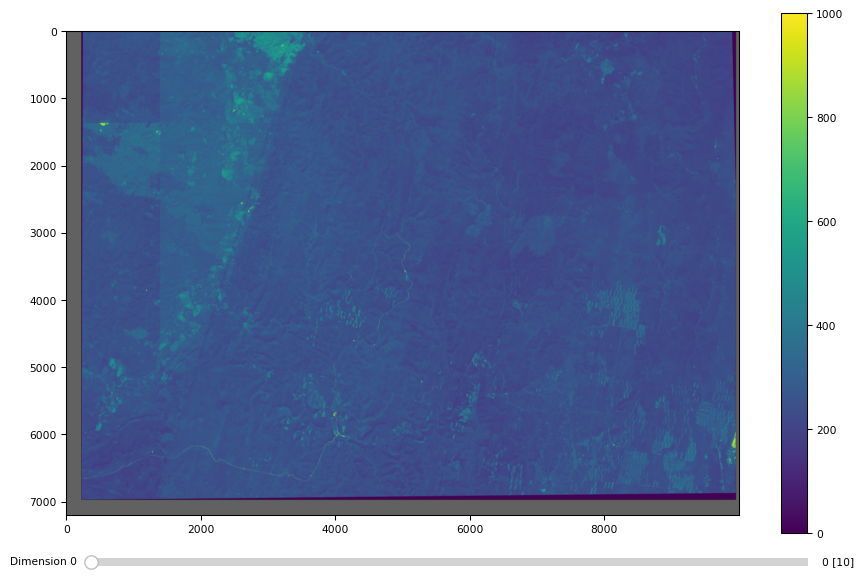

In [23]:
tiff.imshow(image)

(<Figure size 988.8x604.8 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x127987ce0>)

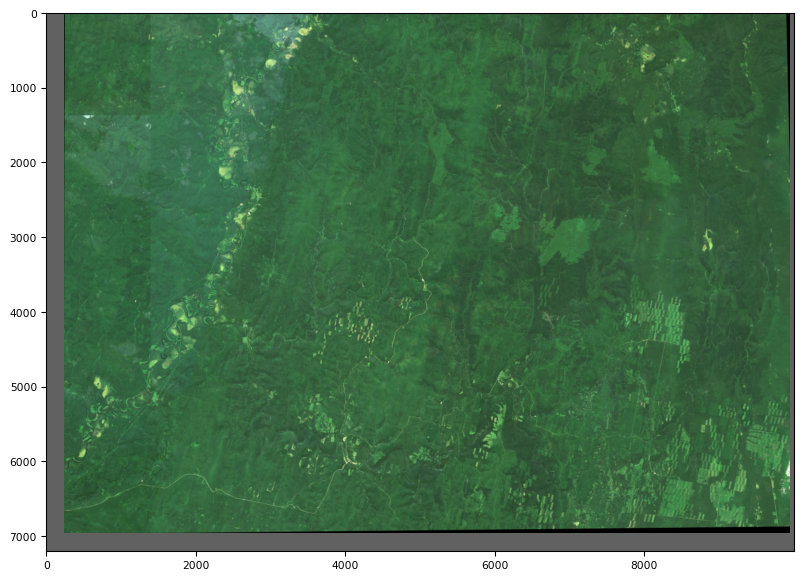

In [24]:
tiff.imshow(np.asarray([image[2,:,:], image[1,:,:], image[0,:,:]]))

We can compute statistics for these bands

In [36]:
stats = []

# when you have nan values in your numpy array, you need to mask them using ~np.isnan(your_array)
# or use np.nanmean, np.nanstd, etc directly. Otherwise you will get nan output

for band in image:
    masked_band = band[~np.isnan(band)]
    stats.append({
    'min': masked_band.min().round(3),
    'mean': masked_band.mean().round(3),
    'median': np.median(masked_band).round(3),
    'max': masked_band.max().round(3)})

In [37]:
stats

[{'min': np.float64(0.0),
  'mean': np.float64(251.907),
  'median': np.float64(245.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(403.119),
  'median': np.float64(398.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(218.704),
  'median': np.float64(213.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(629.718),
  'median': np.float64(623.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(988.765),
  'median': np.float64(1000.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(988.985),
  'median': np.float64(1000.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(988.559),
  'median': np.float64(1000.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(988.958),
  'median': np.float64(1000.0),
  'max': np.float64(1000.0)},
 {'min': np.float64(0.0),
  'mean': np.float64(952.9

We then merge all raster bands to create a single feature space. The shape os a new raster will be 10 spactral bands + chm + dem + age. Totally, we will obtain 13 bands:

'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B11', 'B12', 'CHM', 'DEM', 'AGE'

In [44]:
with rasterio.open('timberstock/2022.tif') as src: # composite Sentinel-2 for 2023
    meta = src.meta
    image = src.read() # 10 bands

with rasterio.open('timberstock/chm.tif') as src: # canopy height model - height
    chm = src.read()

with rasterio.open('timberstock/dem.tif') as src:
    dem = src.read()

with rasterio.open('timberstock/age.tif') as src:
    age = src.read()

result_img = np.concatenate((image, chm, dem, age), axis=0)

In [45]:
outputpath = 'merged_data.tif'
out_meta = meta.copy()
out_meta['count'] = #?# # change number of bands in the metadata properties
with rasterio.open(fp=outputpath,
             mode='w',**out_meta) as dst:
             dst.write(result_img)

(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x1620e75c0>)

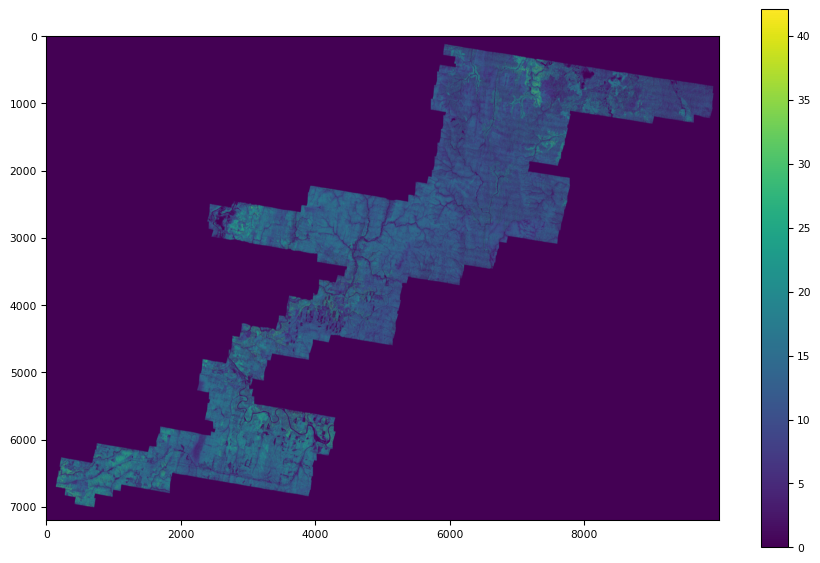

In [46]:
tiff.imshow(result_img[-3, :, :])

In [47]:
merged_img_path = 'merged_data.tif'
with rasterio.open(merged_img_path) as src:
    meta = src.meta
    image = src.read()

In [48]:
meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 65535.0,
 'width': 10000,
 'height': 7200,
 'count': 13,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 40N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",57],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'),
 'transform': Affine(10.0, 0.0, 485999.0,
        0.0, -10.0, 6804001.0)}

(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x587e62a80>)

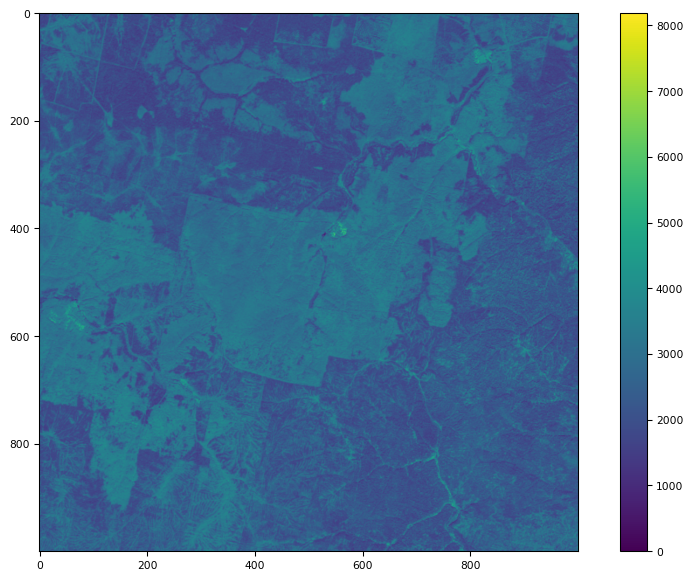

In [49]:
tiff.imshow(image[6, 1000:2000, 1000:2000])

In [50]:
np.max(image)

np.uint16(65535)

In [51]:
meta['crs']

CRS.from_wkt('PROJCS["WGS 84 / UTM zone 40N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",57],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]')

# Create dataset in CSV format

We can read csv file with taxation data. It contains coordinates in format of latitude (y), and longitude (x). The projection of this data is crs='EPSG:32640'. Field based measurements contain timber volume and forest height.

In [5]:
# specify path and read vector polygon shapefile

df_path = 'timberstock/data.csv'
df = pd.read_csv(df_path)
df.head()

,y,x,V,H
0,6745060.540,526642.170,360,22.0
1,6743223.665,526509.015,215,24.3
2,6742455.950,525509.350,514,24.0
3,6740124.512,522847.614,319,19.3
4,6739308.912,524661.734,267,17.8


In [6]:
print(df.size)

3672


In [7]:
print(df.shape)

(918, 4)


Now let's create geo pandas dataframe to process coordinates into georeferenced data, so then we can create polygons.

GeoPandas is based on the pandas. It extends pandas data types to include geometry columns and perform spatial operations.

The main data structure in GeoPandas is the GeoDataFrame that extends the pandas DataFrame. So all the base DataFrame operations can be performed on the GeoDataFrame. The GeoDataFrame contains one or more GeoSeries (that extends pandas Series) each of which contains geometries in a different projection (GeoSeries.crs).

Here is the link for the documentation for [geopandas](https://geopandas.org/en/stable/).

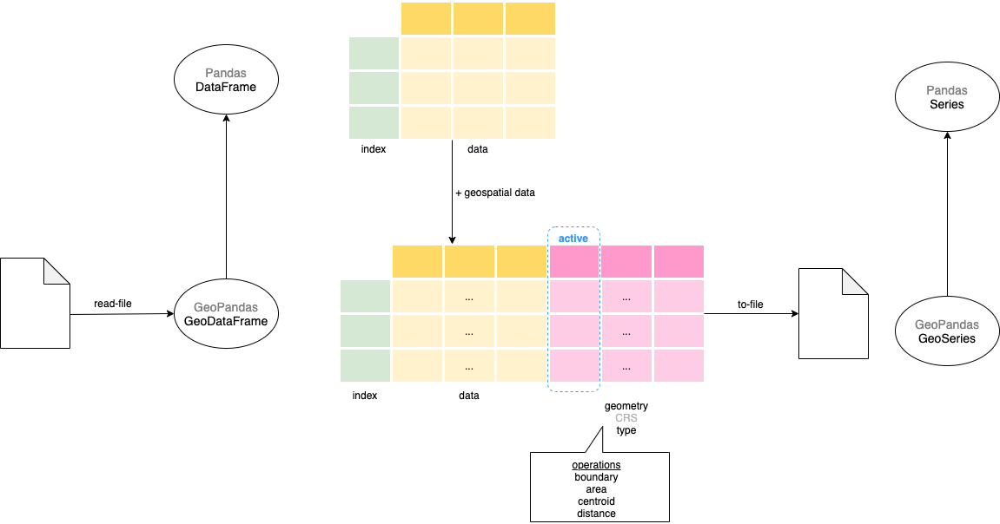

Here we convert points of latitude and longitude into points

In [8]:
geometry = [Point(lon, lat) for lon, lat in zip(df['x'], df['y'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:32640')
gdf.head()

,y,x,V,H,geometry
0,6745060.540,526642.170,360,22.0,POINT (526642.17 6745060.54)
1,6743223.665,526509.015,215,24.3,POINT (526509.015 6743223.665)
2,6742455.950,525509.350,514,24.0,POINT (525509.35 6742455.95)
3,6740124.512,522847.614,319,19.3,POINT (522847.614 6740124.512)
4,6739308.912,524661.734,267,17.8,POINT (524661.734 6739308.912)


In [9]:
print(gdf.dtypes)

y            float64
x            float64
V              int64
H            float64
geometry    geometry
dtype: object


We can now visualize spatial distribution of taxation plots in the georefernces map

In [10]:
gdf.explore()

In [11]:
# code to save map

# m = gdf.explore()
# outfp = r"<your dir path>\base_map.html"
# m.save(outfp)

Right now our geometry is just a set of points. In reality each study plot is a circle with a fixed radius of 9m. 

We set buffer distance to 9m and update geometry with new shapes, namely the POLYGON format

In [12]:
buffer_distance = 9  # radius in meters
gdf.geometry = gdf.buffer(buffer_distance)

In [13]:
gdf.to_file('dataframe.geojson', driver='GeoJSON')

In [14]:
gdf.head()

,y,x,V,H,geometry
0,6745060.540,526642.170,360,22.0,"POLYGON ((526651.17 6745060.54, 526651.127 674..."
1,6743223.665,526509.015,215,24.3,"POLYGON ((526518.015 6743223.665, 526517.972 6..."
2,6742455.950,525509.350,514,24.0,"POLYGON ((525518.35 6742455.95, 525518.307 674..."
3,6740124.512,522847.614,319,19.3,"POLYGON ((522856.614 6740124.512, 522856.571 6..."
4,6739308.912,524661.734,267,17.8,"POLYGON ((524670.734 6739308.912, 524670.691 6..."


In [15]:
gdf.explore()

<Axes: >

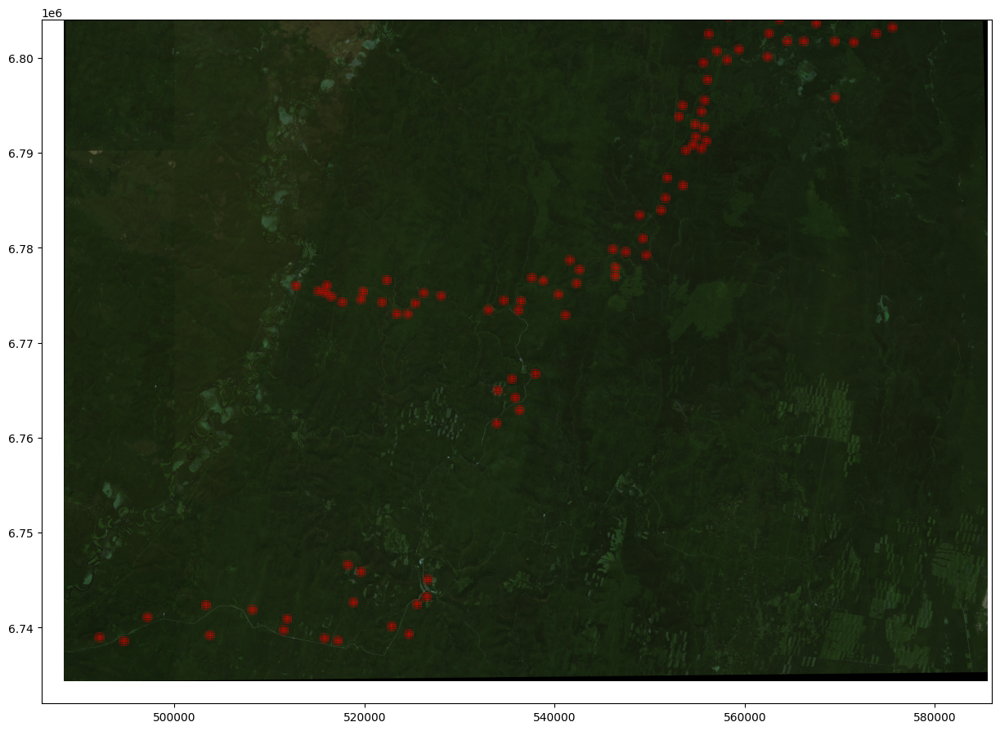

In [16]:
from rasterio.plot import show

ax = gdf.boundary.plot(color="red", figsize=(15,15), linewidth=5)

# demfile = "timberstock/dem.tif" #r"merged_data.tif"
demfile = r"merged_data.tif"
src = rasterio.open(demfile)
show(src, cmap="gray", ax=ax)

### Technicaly. How are we going to estimate volume?

In machine learning tasks, we make a hypothesis that, for a given prediction, we will use a specific set of features. The motivation for the specific configuration of the feature set can be different, but in our case, it is real-world. 

We assume that growing stock volume (GSV) can be approximated as a function of observable predictors:

$GSV=f(X)$,

where $X$ is a set of explanatory variables derived from satellite imagery and auxiliary data. The choice of features is not arbitrary. It is grounded in forest ecology and in the physical principles of remote sensing.


Moreover, when working with data for small areas, data distribution statistics are often more preferable than relying on individual pixel values. **Why?**

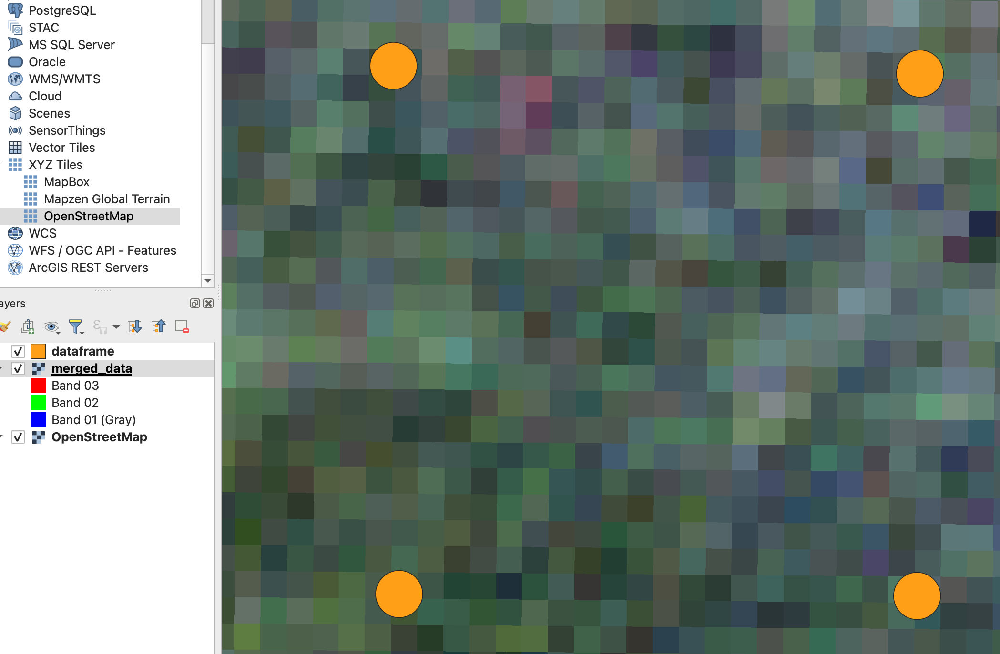


**Answer**

Let's discuss based on our task.

The target variable (GSV) is measured at the plot level, not at the pixel level, so aggregating pixels into summary statistics ensures scale consistency between predictors and response and reduces sensitivity to geolocation errors and within-plot heterogeneity.

In contrast, working directly at the pixel level is more appropriate when:
-  the target variable is defined per pixel
-  the spatial resolution is substantially smaller than the plot size, allowing a meaningful transition from aggregated statistics back to pixel-wise modeling.

To create features for our dataset, we will calculate the following statistics for each inventory plot:

* min,
* max,
* mean,
* median,
* std

Let's create the header for dataframe with all combinations of these statistics and bands' values in the merged image  

In [40]:
combinations = []
cols = ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B11', 'B12', 'CHM', 'DEM', 'AGE']
agg_t = ['min', 'max', 'mean', 'median', 'std']
# Generate combinations
for agg in agg_t:
    for col in cols:
        combinations.append(f"{col}_{agg}")

combinations.append(f"lon") # add header for coordinates
combinations.append(f"lat") # add header for coordinates
combinations.append(f"V") # add the target with timber volume
result_df = pd.DataFrame(columns=combinations)

In [41]:
result_df

,B02_min,B03_min,B04_min,B05_min,B06_min,B07_min,B08_min,B8A_min,B11_min,B12_min,...,B08_std,B8A_std,B11_std,B12_std,CHM_std,DEM_std,AGE_std,lon,lat,V


Let's fill the dataframe with computed values for each individual plot.

In [42]:
%%capture
merged_img_path = 'merged_data.tif' # raster with all spatial features

with rasterio.open(merged_img_path) as src:

    for geometry, lon, lat, vol in zip(gdf.geometry, gdf['x'], gdf['y'], gdf['V']):

        x_list, y_list = geometry.exterior.xy # latitude (y), and longitude (x)
        left = np.min(x_list)
        bottom = np.min(y_list)
        right = np.max(x_list)
        top = np.max(y_list)
        cropped_image = src.read(window=from_bounds(left, bottom, right, top, src.transform))
        feature_vec = cropped_image.reshape(13, -1)
        feature_vec = feature_vec.astype('float')
        feature_vec[feature_vec == 0] = np.nan

        if feature_vec.size == 0: # is zero-size array
            continue
        nanmin = np.nanmin(feature_vec, axis=1)
        nanmax = np.nanmax(feature_vec, axis=1)
        nanmean = np.nanmean(feature_vec, axis=1)
        nanmedian = np.nanmedian(feature_vec, axis=1)
        nanstd = np.nanstd(feature_vec, axis=1)
        merged_array = np.concatenate((nanmin, nanmax, nanmean,
                                        nanmedian, nanstd,
                                        [lon, lat, vol]))
        tmp = pd.DataFrame([merged_array], columns=combinations)
        result_df = pd.concat([result_df, tmp])

In [43]:
result_df.dropna(inplace=True)

In [44]:
print('Number of plots after drop nan values: ', len(result_df), ', number of all plots: ', len(gdf.geometry))

Number of plots after drop nan values:  686 , number of all plots:  918


In [45]:
def calculate_ndvi(b08, b04):
    return (b08 - b04) / (b08 + b04)

def calculate_evi(b08, b04, b02):
    return 2.5 * (b08 - b04) / (b08 + 6 * b04 - 7.5 * b02 + 1)

# Calculate NDVI
for stat in ['min', 'max', 'mean', 'median']:
    result_df[f'NDVI_{stat}'] = calculate_ndvi(result_df[f'B08_{stat}'], result_df[f'B04_{stat}'])

# Calculate EVI
for stat in ['min', 'max', 'mean', 'median']:
    result_df[f'EVI_{stat}'] = calculate_evi(result_df[f'B08_{stat}'], result_df[f'B04_{stat}'], result_df[f'B02_{stat}'])

In [46]:
out_path = 'train_polygon.csv'
result_df.to_csv(out_path, index=False)

# Data analysis

### Visualize the data distribution: with histogram and KDE

A histogram divides the data into bins (intervals) and shows how many observations fall into each bin, resulting in a step-like, discrete visualization that strongly depends on the chosen number and width of the bins. 

In contrast, KDE (Kernel Density Estimation) does not use bins; instead, it produces a smooth, continuous curve that represents an estimate of the probability density function, where the total area under the curve is approximately one. 

While a histogram reflects raw frequencies grouped into intervals, KDE provides a smoothed approximation of the underlying distribution and depends on a smoothing parameter known as bandwidth.

<Axes: ylabel='Frequency'>

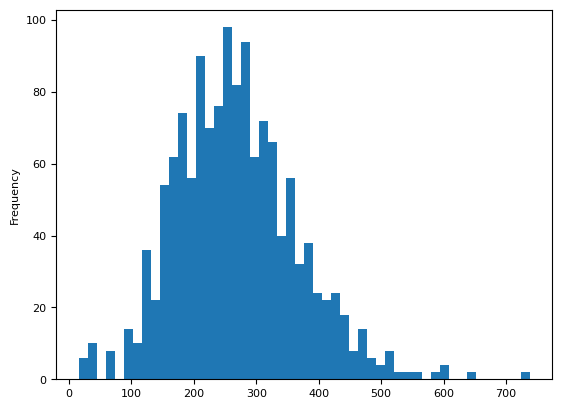

In [84]:
result_df['V'].plot.hist(bins=50)

<Axes: ylabel='Density'>

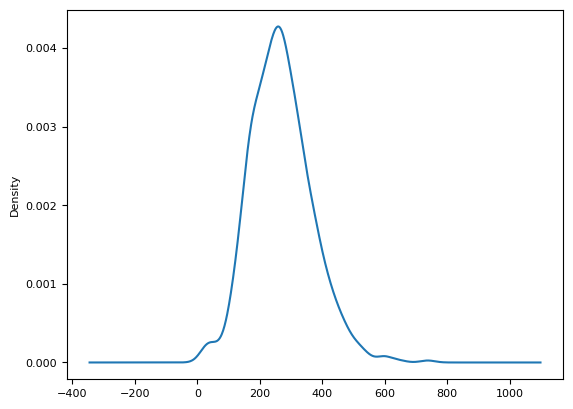

In [86]:
result_df['V'].plot.kde()

In [38]:
np.sum(result_df['B04_std'])

5931.116747319027

<Axes: ylabel='Frequency'>

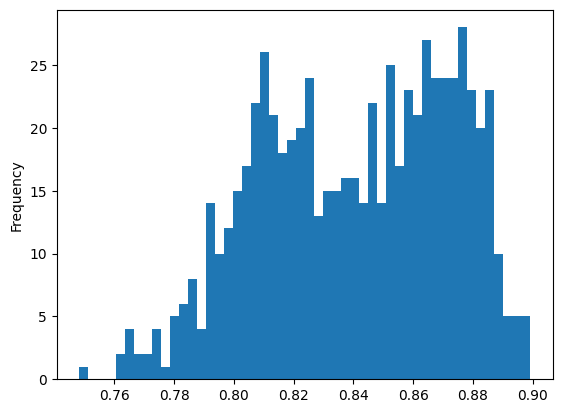

In [48]:
result_df['NDVI_mean'].plot.hist(bins=50)

In [50]:
selected_columns_for_corr = [item for item in combinations if ('min' in item) or ('median' in item) or ('std' in item)]

In [51]:
selected_columns_for_corr

['B02_min',
 'B03_min',
 'B04_min',
 'B05_min',
 'B06_min',
 'B07_min',
 'B08_min',
 'B8A_min',
 'B11_min',
 'B12_min',
 'CHM_min',
 'DEM_min',
 'AGE_min',
 'B02_median',
 'B03_median',
 'B04_median',
 'B05_median',
 'B06_median',
 'B07_median',
 'B08_median',
 'B8A_median',
 'B11_median',
 'B12_median',
 'CHM_median',
 'DEM_median',
 'AGE_median',
 'B02_std',
 'B03_std',
 'B04_std',
 'B05_std',
 'B06_std',
 'B07_std',
 'B08_std',
 'B8A_std',
 'B11_std',
 'B12_std',
 'CHM_std',
 'DEM_std',
 'AGE_std']

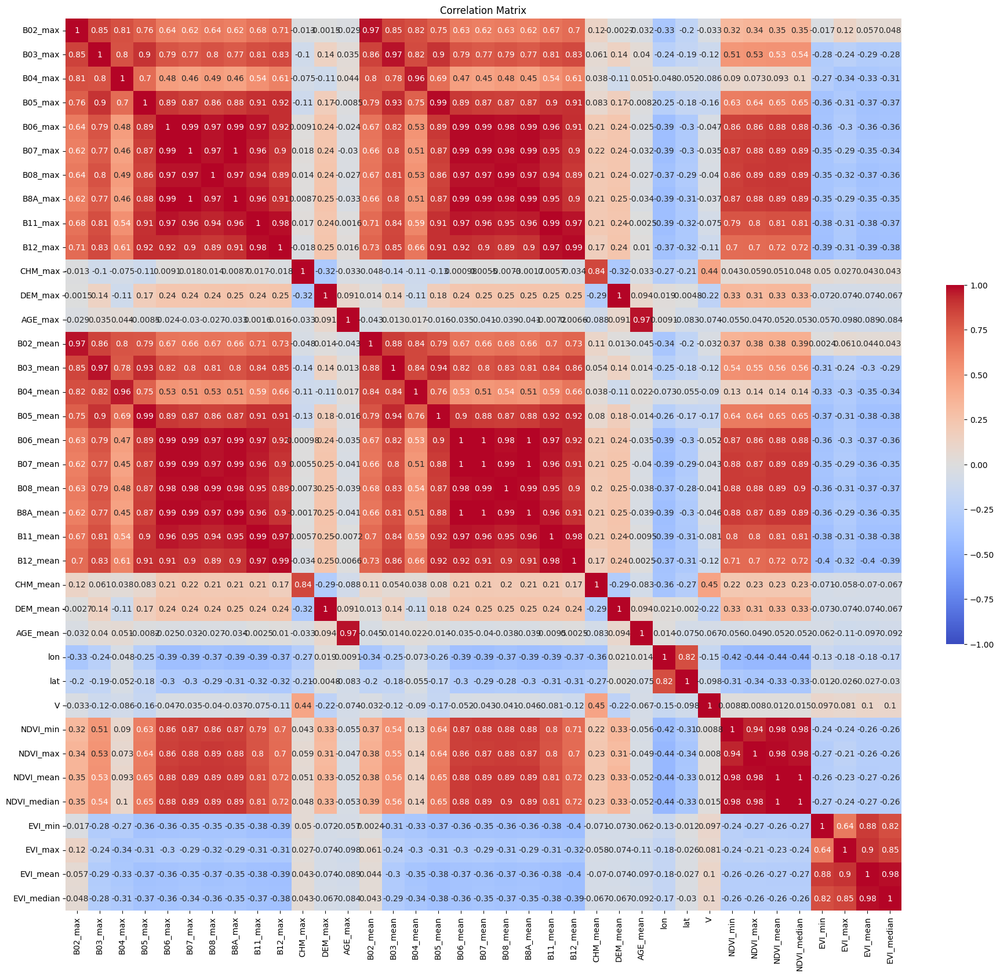

In [52]:
import seaborn as sns

df_corr = result_df.copy()
df_corr = df_corr.drop(columns=selected_columns_for_corr)
df_corr = df_corr.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(df_corr, cmap='coolwarm', vmin=-1, vmax=1, annot=True, cbar_kws={"fraction": 0.02})
plt.title('Correlation Matrix')
plt.show()

## Train model

In [53]:
! pip install xgboost scikit-learn

In [54]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost

In [55]:
csv_name = 'train_polygon.csv' #'dataset.csv'
# csv_name = 'timberstock/data.csv' #'dataset.csv'
dataset = pd.read_csv(csv_name, header=0)

In [63]:
np.random.seed(0)

# y = dataset["V"]
# X = dataset.drop(columns=["V"])
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.33, random_state=0
# )

dataset = dataset.iloc[np.random.permutation(len(dataset))] # shuffle
df_train = dataset[0:int(2*len(dataset)//3)]
df_test = dataset[int(2*len(dataset)//3):]

print('train: ', len(df_train), 'test: ', len(df_test))

# drop target value from features data
y_train = df_train['V']
X_train = df_train.drop(['V'], axis=1)

y_test = df_test['V']
X_test = df_test.drop(['V'], axis=1)

train:  457 test:  229


In [57]:
y_train

593    184.0
638    223.0
634    289.0
404    261.0
635    131.0
       ...  
462    301.0
681    114.0
572    126.0
546    316.0
176     36.0
Name: V, Length: 457, dtype: float64

In [58]:
X_train

,B02_min,B03_min,B04_min,B05_min,B06_min,B07_min,B08_min,B8A_min,B11_min,B12_min,...,lon,lat,NDVI_min,NDVI_max,NDVI_mean,NDVI_median,EVI_min,EVI_max,EVI_mean,EVI_median
593,197.0,323.0,180.0,480.0,1400.0,1718.0,1632.0,1841.0,805.0,377.0,...,555037.070,6791462.131,0.801325,0.808490,0.808198,0.811282,2.938082,3.057111,2.993830,2.987747
638,203.0,295.0,168.0,481.0,1305.0,1546.0,1532.0,1728.0,802.0,384.0,...,555244.970,6794144.450,0.802353,0.774194,0.786133,0.784387,3.348061,3.309558,3.233565,3.143479
634,211.0,323.0,189.0,480.0,1395.0,1665.0,1742.0,1791.0,775.0,365.0,...,555244.810,6794544.270,0.804247,0.808612,0.805345,0.804175,2.999228,3.010331,2.965760,2.927447
404,250.0,413.0,214.0,653.0,2015.0,2387.0,2194.0,2618.0,1101.0,486.0,...,514949.790,6775654.150,0.822259,0.853187,0.834738,0.829578,3.086035,3.163046,3.117346,3.104450
635,214.0,308.0,181.0,504.0,1380.0,1665.0,1676.0,1832.0,819.0,368.0,...,555445.350,6794542.650,0.805062,0.810726,0.809181,0.810241,3.227547,3.172840,3.207120,3.217062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
462,228.0,372.0,190.0,611.0,2188.0,2713.0,2498.0,2844.0,1263.0,538.0,...,542803.151,6777883.776,0.858631,0.881942,0.870820,0.869916,2.991187,2.956140,2.972081,2.972988
681,266.0,452.0,278.0,739.0,1857.0,2140.0,2132.0,2309.0,1232.0,620.0,...,569703.140,6796007.509,0.769295,0.766244,0.769012,0.770292,2.566445,2.682386,2.588043,2.552791
572,205.0,319.0,182.0,548.0,1497.0,1745.0,1714.0,1890.0,876.0,405.0,...,554535.974,6791007.895,0.808017,0.792551,0.800448,0.801045,3.016936,2.864690,2.934148,2.932981
546,197.0,312.0,193.0,464.0,1407.0,1648.0,1682.0,1823.0,828.0,399.0,...,551845.810,6785041.230,0.794133,0.798608,0.798506,0.800500,2.730106,2.985774,2.784678,2.711721


In [59]:
from sklearn.tree import DecisionTreeRegressor

decision_tree = DecisionTreeRegressor(max_depth=3)
decision_tree.fit(X_train, y_train)

pred = decision_tree.predict(X_test)
print('MAPE: ', round(mean_absolute_percentage_error(y_test, pred), 3))
print('MAE: ', round(mean_absolute_error(y_test, pred), 3))

MAPE:  0.364
MAE:  68.278


[Text(0.5, 0.875, 'x[23] <= 16.5\nsquared_error = 9746.828\nsamples = 457\nvalue = 269.923'),
 Text(0.25, 0.625, 'x[42] <= 701.0\nsquared_error = 6264.469\nsamples = 199\nvalue = 225.543'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'x[38] <= 92.75\nsquared_error = 5652.759\nsamples = 135\nvalue = 247.067'),
 Text(0.0625, 0.125, 'squared_error = 4854.444\nsamples = 83\nvalue = 271.036'),
 Text(0.1875, 0.125, 'squared_error = 4546.194\nsamples = 52\nvalue = 208.808'),
 Text(0.375, 0.375, 'x[49] <= 11.25\nsquared_error = 4516.215\nsamples = 64\nvalue = 180.141'),
 Text(0.3125, 0.125, 'squared_error = 4461.523\nsamples = 22\nvalue = 129.5'),
 Text(0.4375, 0.125, 'squared_error = 2497.937\nsamples = 42\nvalue = 206.667'),
 Text(0.75, 0.625, 'x[36] <= 17.875\nsquared_error = 9741.805\nsamples = 258\nvalue = 304.155'),
 Text(0.625, 0.75, '  False'),
 Text(0.625, 0.375, 'x[9] <= 334.5\nsquared_error = 7784.562\nsamples = 172\nvalue = 284.384'),
 Text(0.5625, 0.125, 'squared_error = 276

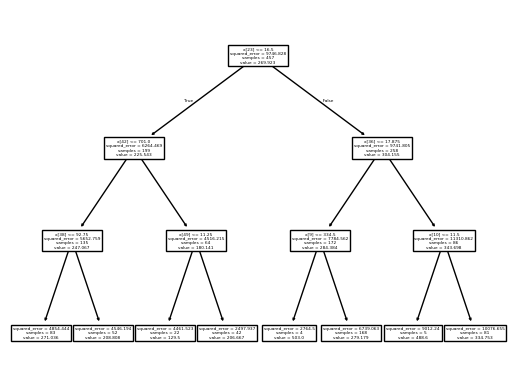

In [60]:
from sklearn import tree
tree.plot_tree(decision_tree)

In [61]:
y_test

605    115.0
372    206.0
168    217.0
347    305.0
376    263.0
       ...  
359    320.0
192    157.0
629    334.0
559    255.0
684    156.0
Name: V, Length: 229, dtype: float64

In [62]:
pred

array([129.5       , 279.17857143, 206.66666667, 271.03614458,
       279.17857143, 208.80769231, 129.5       , 208.80769231,
       271.03614458, 279.17857143, 334.75308642, 271.03614458,
       208.80769231, 279.17857143, 279.17857143, 279.17857143,
       279.17857143, 206.66666667, 503.        , 129.5       ,
       208.80769231, 279.17857143, 334.75308642, 279.17857143,
       271.03614458, 334.75308642, 271.03614458, 271.03614458,
       129.5       , 271.03614458, 279.17857143, 279.17857143,
       208.80769231, 334.75308642, 206.66666667, 279.17857143,
       279.17857143, 334.75308642, 334.75308642, 271.03614458,
       279.17857143, 129.5       , 279.17857143, 271.03614458,
       129.5       , 279.17857143, 279.17857143, 503.        ,
       279.17857143, 334.75308642, 334.75308642, 279.17857143,
       279.17857143, 206.66666667, 208.80769231, 208.80769231,
       208.80769231, 279.17857143, 334.75308642, 279.17857143,
       279.17857143, 503.        , 271.03614458, 279.17

In [69]:
# RandomForest
rfr = RandomForestRegressor(n_estimators=200, random_state=0)
rfr.fit(X_train, y_train)

pred = rfr.predict(X_test)
print('MAPE: ', round(mean_absolute_percentage_error(y_test, pred), 3))
print('MAE: ', round(mean_absolute_error(y_test, pred), 3))

MAPE:  0.28
MAE:  61.949


In [74]:
# XGBoost
scaler = MinMaxScaler()

x_train = scaler.fit_transform(X_train)
x_test = scaler.transform(X_test)

xgbr = xgboost.XGBRegressor(n_estimators=800,
        max_depth=6,random_state = 0)
xgbr.fit(x_train, y_train)

pred = xgbr.predict(x_test)
print('MAPE: ', round(mean_absolute_percentage_error(y_test, pred), 3))
print('MAE: ', round(mean_absolute_error(y_test, pred), 3))

MAPE:  0.307
MAE:  66.335


Let's try to add cross validation. Please refere to https://scikit-learn.org/dev/modules/generated/sklearn.model_selection.KFold.html

In [80]:
from sklearn.model_selection import KFold, cross_validate

cv = KFold(n_splits=5, shuffle=True, random_state=0)
rfr = RandomForestRegressor(n_estimators=100, random_state=0)

mape_scores = []
mae_scores = []
scoring = {
    "mae": "neg_mean_absolute_error",
}

y = dataset['V']
X = dataset.drop(['V'], axis=1)

cv_res = cross_validate(rfr, X, y, cv=cv, scoring=scoring, n_jobs=-1)
mae = -cv_res["test_mae"]
print("RFR MAE per fold", mae)
print(f"RFR CV | MAE={mae.mean():.4f}")

RFR MAE per fold [58.46108696 66.36532847 63.07080292 64.59649635 67.49036496]
RFR CV | MAE=63.9968


# Code to convert data from GEE into format of Sentinel-Hub

When we download imagery from GEE, it returns 23 bands in the raster file. However, for our study, we need only 10 spectral bands with spatial resolution from 10 t0 20 m. These bands are 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B11', 'B12'. The corresponding bands in GEE file have the following indices 1, 2, 3, 4, 5, 6, 7, 8, 10, 11

Let's read, extract channels, and write new file with the same resolution band only 10 spectral bands.

In the shared dataset images are already preprocessed, so you should skip this code.

In [ ]:
# # set file name
# file_path = 'timberstock/2022.tif'

# # set path to output file
# outputpath = '2022.tif'

# # read file and meta data
# with rasterio.open(file_path) as src:
#     meta = src.meta
#     image = src.read()

In [ ]:
# image.shape

(10, 7200, 10000)

In [ ]:
# meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 65535.0,
 'width': 10000,
 'height': 7200,
 'count': 10,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 40N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",57],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'),
 'transform': Affine(10.0, 0.0, 485999.0,
        0.0, -10.0, 6804001.0)}

In [ ]:
# create new empty image with the same resolution but 10 bands
# image_new = np.zeros((10, image.shape[1], image.shape[2]), dtype='uint16')

In [ ]:
# image_new.shape

(10, 7200, 10000)

In [ ]:
# check new and all indices
# for ind, band in enumerate([1, 2, 3, 4, 5, 6, 7, 8, 10, 11]):
#     print(ind, band)

0 1
1 2
2 3
3 4
4 5
5 6
6 7
7 8
8 10
9 11


In [ ]:
# copy the necessary bands to new file
# for ind, band in enumerate([1, 2, 3, 4, 5, 6, 7, 8, 10, 11]):
#     image_new[ind] = image[band]

IndexError: index 10 is out of bounds for axis 0 with size 10

In [ ]:
# out_meta = meta.copy()
# out_meta['count'] = 10 # change number of bands in the metadata properties
# with rasterio.open(fp=outputpath, # outputpath_name
#              mode='w',**out_meta) as dst:
#              dst.write(image_new) # the numer one is the number of bands